In [ ]:
#This scipt is for reading momentum surfaces in a Tropical Cyclone

In [1]:
#input necessary packages here

#For Map
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
import matplotlib.ticker as mticker
from matplotlib.gridspec import GridSpec
from matplotlib.ticker import ScalarFormatter

#wrf packages
import wrf
from wrf import (to_np, interplevel, geo_bounds, smooth2d, get_cartopy, cartopy_xlim,
                 cartopy_ylim, latlon_coords, getvar, CoordPair, vertcross, ll_to_xy, xy_to_ll)

#to read in data
import glob
import matplotlib.pyplot as plt

#for some fun math
import math
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr
from datetime import datetime
from netCDF4 import Dataset, num2date, date2num
from scipy.ndimage import gaussian_filter

/Users/cjmasiel/opt/anaconda3/lib/python3.9/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.8.3' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED
/Users/cjmasiel/opt/anaconda3/lib/python3.9/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


In [2]:
#only run the cell below for the 1.33 kilometer inner nest

#Function Below is for a storm following map projection. Credit: Dr. Sharanya Majumdar @The University of Miami
dataproj = ccrs.PlateCarree()

def create_map_background(tclon, tclat, ax=None):
    tclon5a = 5 * (int(tclon / 5) - 1)
    tclon5b = 5 * (int(tclon / 5))
    tclat5a = 5 * (int(tclat / 5) - 1)
    tclat5b = 5 * (int(tclat / 5))

    if ax is None:
        fig = plt.figure(figsize=(15, 15))
        ax = plt.subplot(111, projection=ccrs.PlateCarree())
    else:
        fig = None

    ax.set_extent([tclon - 5, tclon + 5, tclat - 5, tclat + 5], ccrs.PlateCarree())
    gl = ax.gridlines(color='gray', alpha=0.5, draw_labels=True)
    gl.top_labels = gl.right_labels = False
    gl.xlabel_style = gl.ylabel_style = {'fontsize': 16}
    gl.xlocator = mticker.FixedLocator([tclon5a - 10, tclon5a - 5, tclon5a, tclon5b, tclon5b + 5, tclon5b + 10])
    gl.ylocator = mticker.FixedLocator([tclat5a - 10, tclat5a - 5, tclat5a, tclat5b, tclat5b + 5, tclat5b + 10])
    gl.xformatter = LongitudeFormatter()
    gl.yformatter = LatitudeFormatter()
    ax.xaxis.set_major_formatter(gl.xformatter)
    ax.yaxis.set_major_formatter(gl.yformatter)

    return fig, ax

In [3]:
#First, Specifiy File path
filepath = '/Users/cjmasiel/Desktop/Anantha_Final/real_plane/wrfout_d02_files/wrfout_d02*'  #For ncar files
datafiles = sorted(glob.glob(filepath))

In [4]:
# set some constants for later use that we may or may not use, just there for any meteorological claculation you may conduct
deltap     = 5000.        # vertical isobaric spacing
resol      = 0.5          # degrees
pref       = 100000.      # Pa
cv         = 717.         # J kg-1 K-1
cp         = 1004.7       # J kg-1 K-1
omega      = 7.292e-5     # Rotation rate s-1       
rd         = 287.04       # J kg-1 K-1
fo         = 1.0e-4       # s-1; assume constant Coriolis parameter (Eliassen 1962)
po         = 100000.      # standard pressure (Pa)
r_earth    = 6.3781e6     # meters (Earth Radius)
grav       = 9.80665      # m/s-2
d2r        = (np.pi)/180. # degrees to radians
rv         = 461.50
k          = 0.4          #Von Karmen Constant

def find_nearest(a, val):
    return np.abs(a - val).argmin()

In [5]:
#Pressure levels we are considering for our aziumuthal averages
plevs  = [100000., 99000., 98000., 97000., 96000., 95000., 94000., 93000., 92000., 91000.,
           90000., 89000., 88000., 87000., 86000., 85000., 84000., 83000., 82000., 81000., 80000.,
           77500., 75000., 72500., 70000., 67500., 65000., 62500., 60000., 57500., 55000., 52500.,
           50000., 47500., 45000., 42500., 40000., 37500., 35000., 32500., 30000., 27500., 25000.,
           22500., 20000., 17500., 15000., 12500., 10000., 7500., 6000.]

#Vertical levels we are considering for azimuthal averages 
zlevs = [ 10., 20., 30., 40., 50., 60., 70., 80., 90., 100.,  200.,  300.,  400.,  500.,  600.,  700.,  800.,  900., 1000.,
         1100., 1200., 1300., 1400., 1500., 1600., 1700., 1800., 1900., 2000., 2250.,
         2500., 2750., 3000., 3250., 3500., 3750., 4000., 4250., 4500., 4750., 5000.,
         5500., 6000., 6500., 7000., 7500., 8000., 8500., 9000., 9500., 10000., 10500.,
         11000., 11500., 12000., 12500., 13000., 13500., 14000., 14500., 15000., 15500.,
         16000., 16500., 17000., 17500., 18000., 18500.]

nlevs   = len(plevs) #level of interest is 850 hPa, which is the sixth level
n_zlevs = len(zlevs)

print("Number of Pressure levels in the vertical", nlevs)
print("Number of height levels in the vertical", n_zlevs)
yplabs = ['']*nlevs
yzlabs = ['']*n_zlevs

Number of Pressure levels in the vertical 51
Number of height levels in the vertical 68


In [6]:
#New Color Scale for IR Brightness
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
from matplotlib import cm

#Creating IR color Scale
def make_Ramp( ramp_colors ):
    from colour import Color
    from matplotlib.colors import LinearSegmentedColormap

    color_ramp = LinearSegmentedColormap.from_list( 'my_list', [ Color( c1 ).rgb for c1 in ramp_colors ] )
    plt.figure( figsize = (15,3))
    plt.imshow( [list(np.arange(0, len( ramp_colors ) , 0.1)) ] , interpolation='nearest', origin='lower', cmap= color_ramp )
    plt.xticks([])
    plt.yticks([])
    return color_ramp

custom_ramp = make_Ramp( ["#00000a","#000014","#00001e","#000025","#00002a","#00002e","#000032","#000036","#00003a","#00003e",
                          "#000042","#000046","#00004a","#00004f","#000052","#010055","#010057","#020059","#02005c","#03005e",
                          "#040061","#040063","#050065","#060067","#070069","#08006b","#09006e","#0a0070","#0b0073","#0c0074",
                          "#0d0075","#0d0076","#0e0077","#100078","#120079","#13007b","#15007c","#17007d","#19007e","#1b0080",
                          "#1c0081","#1e0083","#200084","#220085","#240086","#260087","#280089","#2a0089","#2c008a","#2e008b",
                          "#30008c","#32008d","#34008e","#36008e","#38008f","#390090","#3b0091","#3c0092","#3e0093","#3f0093",
                          "#410094","#420095","#440095","#450096","#470096","#490096","#4a0096","#4c0097","#4e0097","#4f0097",
                          "#510097","#520098","#540098","#560098","#580099","#5a0099","#5c0099","#5d009a","#5f009a","#61009b",
                          "#63009b","#64009b","#66009b","#68009b","#6a009b","#6c009c","#6d009c","#6f009c","#70009c","#71009d",
                          "#73009d","#75009d","#77009d","#78009d","#7a009d","#7c009d","#7e009d","#7f009d","#81009d","#83009d",
                          "#84009d","#86009d","#87009d","#89009d","#8a009d","#8b009d","#8d009d","#8f009c","#91009c","#93009c",
                          "#95009c","#96009b","#98009b","#99009b","#9b009b","#9c009b","#9d009b","#9f009b","#a0009b","#a2009b",
                          "#a3009b","#a4009b","#a6009a","#a7009a","#a8009a","#a90099","#aa0099","#ab0099","#ad0099","#ae0198",
                          "#af0198","#b00198","#b00198","#b10197","#b20197","#b30196","#b40296","#b50295","#b60295","#b70395",
                          "#b80395","#b90495","#ba0495","#ba0494","#bb0593","#bc0593","#bd0593","#be0692","#bf0692","#bf0692",
                          "#c00791","#c00791","#c10890","#c10990","#c20a8f","#c30a8e","#c30b8e","#c40c8d","#c50c8c","#c60d8b",
                          "#c60e8a","#c70f89","#c81088","#c91187","#ca1286","#ca1385","#cb1385","#cb1484","#cc1582","#cd1681",
                          "#ce1780","#ce187e","#cf187c","#cf197b","#d01a79","#d11b78","#d11c76","#d21c75","#d21d74","#d31e72",
                          "#d32071","#d4216f","#d4226e","#d5236b","#d52469","#d62567","#d72665","#d82764","#d82862","#d92a60",
                          "#da2b5e","#da2c5c","#db2e5a","#db2f57","#dc2f54","#dd3051","#dd314e","#de324a","#de3347","#df3444",
                          "#df3541","#df363d","#e0373a","#e03837","#e03933","#e13a30","#e23b2d","#e23c2a","#e33d26","#e33e23",
                          "#e43f20","#e4411d","#e4421c","#e5431b","#e54419","#e54518","#e64616","#e74715","#e74814","#e74913",
                          "#e84a12","#e84c10","#e84c0f","#e94d0e","#e94d0d","#ea4e0c","#ea4f0c","#eb500b","#eb510a","#eb520a",
                          "#eb5309","#ec5409","#ec5608","#ec5708","#ec5808","#ed5907","#ed5a07","#ed5b06","#ee5c06","#ee5c05",
                          "#ee5d05","#ee5e05","#ef5f04","#ef6004","#ef6104","#ef6204","#f06303","#f06403","#f06503","#f16603",
                          "#f16603","#f16703","#f16803","#f16902","#f16a02","#f16b02","#f16b02","#f26c01","#f26d01","#f26e01",
                          "#f36f01","#f37001","#f37101","#f37201","#f47300","#f47400","#f47500","#f47600","#f47700","#f47800",
                          "#f47a00","#f57b00","#f57c00","#f57e00","#f57f00","#f68000","#f68100","#f68200","#f78300","#f78400",
                          "#f78500","#f78600","#f88700","#f88800","#f88800","#f88900","#f88a00","#f88b00","#f88c00","#f98d00",
                          "#f98d00","#f98e00","#f98f00","#f99000","#f99100","#f99200","#f99300","#fa9400","#fa9500","#fa9600",
                          "#fb9800","#fb9900","#fb9a00","#fb9c00","#fc9d00","#fc9f00","#fca000","#fca100","#fda200","#fda300",
                          "#fda400","#fda600","#fda700","#fda800","#fdaa00","#fdab00","#fdac00","#fdad00","#fdae00","#feaf00",
                          "#feb000","#feb100","#feb200","#feb300","#feb400","#feb500","#feb600","#feb800","#feb900","#feb900",
                          "#feba00","#febb00","#febc00","#febd00","#febe00","#fec000","#fec100","#fec200","#fec300","#fec400",
                          "#fec500","#fec600","#fec700","#fec800","#fec901","#feca01","#feca01","#fecb01","#fecc02","#fecd02",
                          "#fece03","#fecf04","#fecf04","#fed005","#fed106","#fed308","#fed409","#fed50a","#fed60a","#fed70b",
                          "#fed80c","#fed90d","#ffda0e","#ffda0e","#ffdb10","#ffdc12","#ffdc14","#ffdd16","#ffde19","#ffde1b",
                          "#ffdf1e","#ffe020","#ffe122","#ffe224","#ffe226","#ffe328","#ffe42b","#ffe42e","#ffe531","#ffe635",
                          "#ffe638","#ffe73c","#ffe83f","#ffe943","#ffea46","#ffeb49","#ffeb4d","#ffec50","#ffed54","#ffee57",
                          "#ffee5b","#ffee5f","#ffef63","#ffef67","#fff06a","#fff06e","#fff172","#fff177","#fff17b","#fff280",
                          "#fff285","#fff28a","#fff38e","#fff492","#fff496","#fff49a","#fff59e","#fff5a2","#fff5a6","#fff6aa",
                          "#fff6af","#fff7b3","#fff7b6","#fff8ba","#fff8bd","#fff8c1","#fff8c4","#fff9c7","#fff9ca","#fff9cd",
                          "#fffad1","#fffad4","#fffbd8","#fffcdb","#fffcdf","#fffde2","#fffde5","#fffde8","#fffeeb","#fffeee",
                          "#fffef1","#fffef4","#fffff6"]) 

top = custom_ramp
bottom = cm.get_cmap('Greys', 128)

newcolors = np.vstack((top(np.linspace(0,1,66)), 
                     bottom(np.linspace(0, 1, 33))))

newcmp = ListedColormap(newcolors, name = 'Cam_Cool_Color_Scale')

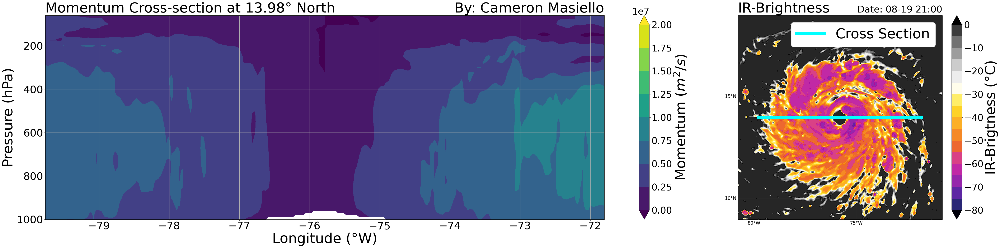

In [7]:
for item in range(15,16):
    ncfile = Dataset(datafiles[item])
    wrf_out_data = xr.open_dataset(datafiles[item])   
    Time = wrf.extract_times(ncfile, timeidx=0, method='cat', squeeze=True, cache=None, meta=False, do_xtime=False)
    timestr=(str(Time))

    #for plotting
    titletime=(timestr[0:10]+' '+timestr[11:16])
    filetime= (timestr[0:10]+'_'+timestr[11:13])

    #Next, isolate the variable we care to look at, in this case we will only care about the pressure pertubations
    P_pertubation = wrf_out_data['P']
    surface_P_pertubation = P_pertubation[0,0,:,:]
    
    # Apply a Gaussian filter to smooth the pressure field
    smoothed_pressure = gaussian_filter(surface_P_pertubation, sigma=10)  # Adjust sigma as necessary

    # Now find the minimum pressure in the smoothed field
    minpressure_smoothed = np.min(smoothed_pressure)
    #print(minpressure_smoothed)
    minp_smoothed = minpressure_smoothed

    # Get the index of the minimum pressure
    p_index_smoothed = np.argwhere(smoothed_pressure == minp_smoothed)
    s_n_smoothed = p_index_smoothed[0][0]
    w_e_smoothed = p_index_smoothed[0][1]

    # Update the storm center position
    ypos = s_n_smoothed
    xpos = w_e_smoothed

    tc_lon = wrf_out_data['XLONG'][0,s_n_smoothed,w_e_smoothed].values
    tc_lat = wrf_out_data['XLAT'][0,s_n_smoothed,w_e_smoothed].values

    #fig, ax = create_map_background(tc_lon,tc_lat) #We are only looking at 11 indices, and our list goes from 0-11, not 24 and up
    #################################################################################################################################################
    #now that we have center information, we can do momentum calculation

    #constants
    lats = getvar(ncfile, "XLAT")
    lons = getvar(ncfile, "XLONG") 
    land = getvar(ncfile, "LANDMASK")
    ptop = getvar(ncfile, "P_TOP")

    nx = lats.shape[0]
    ny = lats.shape[1]
    nz = P_pertubation.shape[1]

    #variables we will need for momentum calculations
    # Get variables 
    z = getvar(ncfile, "z")
    p = getvar(ncfile, "pressure")
    ua = getvar(ncfile, "ua")
    va = getvar(ncfile, "va")
    f = wrf_out_data['F'][0,:,:]

    ugrd, vgrd, zgrd, pgrd = [np.zeros([nx,ny,nlevs]) for _ in range(4)]  #Range is just the number of variables specified to the left

    for k in range (nlevs):
        clev = plevs[k]/100.
        yplabs[k] = clev

        #Do vertical interpolation to specified pressure surfaces (in hPa)
        uap   = interplevel(ua, p, clev)
        vap   = interplevel(va, p, clev)
        z_new = interplevel(z, p, clev)
        p_new = interplevel(p, p, clev)

        #Smoothing factor, redundat step from old scripts, but if you would want to apply smoothing you would do that here
        #smfac = 3   # light smoothing, none for reflectivity
        #smoothing example: ugrd[:,:,k] = mpcalc.smooth_gaussian(uap[:,:],smfac)
        ugrd[:,:,k] = uap[:,:]
        vgrd[:,:,k] = vap[:,:]
        zgrd[:,:,k] = z_new[:,:]
        pgrd[:,:,k] = p_new[:,:]
        

    #First, we have to create lists
    ydist, xdist, tcdist, rlonfac, theta_ang = [np.zeros([nx,ny]) for _ in range(5)]
    u_radial, v_azimuth, momentum            = [np.zeros([nx,ny,nlevs]) for _ in range(3)]
    
    # compute distance from each grid point to storm center
    rlonfac[:,:] = 111000.*np.cos(d2r*lats[:,:])
    ydist[:,:]   = (lats[:,:] - lats[ypos,xpos])*111000
    xdist[:,:]   = (lons[:,:] - (lons[ypos,xpos]))*rlonfac
    tcdist[:,:]  = (xdist[:,:]**2 + ydist[:,:]**2)**0.5
    
    #cvalculate angle
    theta_ang = np.arctan2(ydist, xdist)

    # Pre-calculate cos and sin of theta_ang for use in vectorized calculations
    cos_theta = np.cos(theta_ang)
    sin_theta = np.sin(theta_ang)
    
    for k in range(nlevs):
        #print("The number loop we are in is", k)
        #Vectorized calculation of u_radial and v_azimuth
        u_radial[:,:,k] = ugrd[:,:,k]*cos_theta + vgrd[:,:,k]*sin_theta
        v_azimuth[:,:,k] = -ugrd[:,:,k]*sin_theta + vgrd[:,:,k]*cos_theta
        
        #Vectorized calculation of momentum
        momentum[:,:,k] = tcdist * v_azimuth[:,:,k] + (1/2) * f * (tcdist**2)
    
    #################################################################################################
    #This is how we calculate the cross section!
    
    #now, we are doing west/east cross sections so only care about the value of our longitude beginning and end point, 
    lon_beginning = tc_lon - 4 #4 degrees lon to the left of the TC center
    lon_ending    = tc_lon + 4 #4 degrees lon to the right of the TC center

    start_point = CoordPair(lat = tc_lat, lon = lon_beginning )
    end_point = CoordPair(lat = tc_lat, lon = lon_ending)

    #transpose momentum array into the correct shape 
    momentum_transposed = np.transpose(momentum, (2, 0, 1))
        #If you wanted to compute a different variable, say theta, you would do that here and by 
        #adding that variable to the wrfgetvar interpolation above

    #Convert start and end point lat/lon to grid indices
    start_x, start_y = ll_to_xy(ncfile, start_point.lat, start_point.lon)
    end_x, end_y = ll_to_xy(ncfile, end_point.lat, end_point.lon)

    cross_section_momentum = momentum_transposed[:, start_y.values, start_x.values:end_x.values + 1]

    #Mask the NaN values
    masked_cross_section_momentum = np.ma.masked_invalid(cross_section_momentum)

    vertical_levels = np.arange(masked_cross_section_momentum.shape[0])  # Your vertical levels (51 levels in this case)
    horizontal_extent = np.arange(masked_cross_section_momentum.shape[1])  # Your horizontal extent (581 points in this case)

    #Create an array of longitude values corresponding to the cross-section
    cross_section_lons = lons[start_y.values, start_x.values:end_x.values + 1]
    cross_section_lons = cross_section_lons.squeeze()

    #Assuming pressure is in hPa and we have pressure levels for the Y-axis
    Y = np.array(plevs) / 100.0  # Convert from Pa to hPa 

    #X is 1D, representing the longitude values across the cross-section
    X = cross_section_lons[:]
    
    #Assuming Y is the pressure values obtained as shown in previous steps
    X2D, Y2D = np.meshgrid(cross_section_lons,  Y)
    
    ##################################################################################################
    #IR brightness temperature
    wrf_out_OLR =  wrf_out_data['OLR'][0,:,:]
    
    wrf_out_OLR_T = -273.15 + (wrf_out_OLR.values + 310)/2
    ##################################################################################################
    #Plotting
    fig = plt.figure(figsize=(48, 12))
    
    gs = GridSpec(1, 2, width_ratios=[3, 1], figure=fig)

    #Momentum plot
    ax1 = fig.add_subplot(gs[0])
    contourf1 = ax1.contourf(X2D, Y2D, masked_cross_section_momentum, 
                             levels=np.arange(0, 2.25e7, .25e7), 
                             cmap='viridis', 
                             extend='both')
    #Adding a colorbar for momentum
    cbar1 = fig.colorbar(contourf1, ax=ax1)
    cbar1.set_label(r'Momentum ($m^2/s$)', fontsize=48)
    cbar1.ax.tick_params(labelsize=32)
    #cbar1.ax.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
    cbar1.ax.yaxis.get_offset_text().set(size=32)

    #Set axis labels for momentum plot
    ax1.invert_yaxis()
    ax1.set_xlabel('Longitude (°W)', fontsize=48)
    ax1.set_ylabel('Pressure (hPa)', fontsize=48)
    
    #Set tick size for momentum plot
    ax1.tick_params(axis='both', which='major', labelsize=36)
    ax1.tick_params(axis='both', which='minor', labelsize=32)
    
    ax1.grid(True)

    #Title for momentum plot
    ax1.set_title(f'Momentum Cross-section at {tc_lat:.2f}° North', loc='left', fontsize=48)
    ax1.set_title("By: Cameron Masiello", loc='right', fontsize=48)

    #IR brightness plot
    ax2 = fig.add_subplot(gs[1], projection=ccrs.PlateCarree())
    create_map_background(tc_lon, tc_lat, ax=ax2)
    contourf2 = ax2.contourf(lons, lats, wrf_out_OLR_T, 
                             origin='lower', 
                             cmap=newcmp, 
                             levels=np.arange(-80, 5, 5), 
                             alpha=.85, 
                             extend='both')

    #Adding a colorbar for IR brightness
    cbar2 = fig.colorbar(contourf2, ax=ax2, fraction=0.046, pad=0.04)
    cbar2.set_label(r'IR-Brigtness (°C)', fontsize=48)
    cbar2.ax.tick_params(labelsize=32)

    #Add cross-section line
    ax2.plot(cross_section_lons, [tc_lat]*len(cross_section_lons), 'cyan', linewidth=10, label='Cross Section')

    #Add legend for IR brightness plot
    ax2.legend(loc='upper right', fontsize=48, framealpha=1)

    #Set axis labels for IR brightness plot
    ax2.set_xlabel('Longitude (°W)', fontsize=48)
    ax2.set_ylabel('Latitude (°N)', fontsize=48)
    
    #Set tick size for momentum plot
    ax2.tick_params(axis='both', which='major', labelsize=36)
    ax2.tick_params(axis='both', which='minor', labelsize=32)

    #Title for IR brightness plot
    ax2.set_title(f'IR-Brightness', loc='left', fontsize = 48)
    ax2.set_title(f'Date: {titletime[5:]}', loc='right', fontsize = 32)

    #Adjust layout and show plot
    plt.tight_layout()
    plt.show()

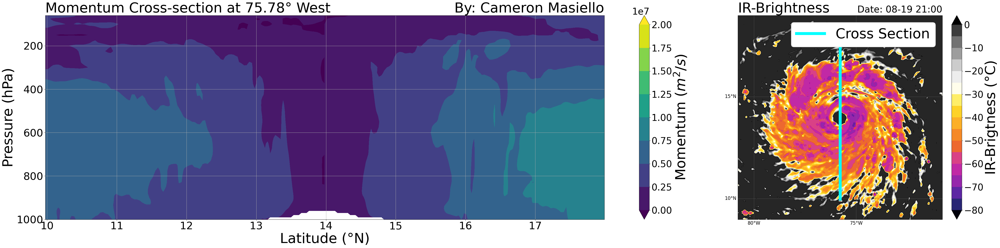

In [8]:
for item in range(15,16):
    ncfile = Dataset(datafiles[item])
    wrf_out_data = xr.open_dataset(datafiles[item])   
    Time = wrf.extract_times(ncfile, timeidx=0, method='cat', squeeze=True, cache=None, meta=False, do_xtime=False)
    timestr=(str(Time))

    #for plotting
    titletime=(timestr[0:10]+' '+timestr[11:16])
    filetime= (timestr[0:10]+'_'+timestr[11:13])

    #Next, isolate the variable we care to look at, in this case we will only care about the pressure pertubations
    P_pertubation = wrf_out_data['P']
    surface_P_pertubation = P_pertubation[0,0,:,:]
    
    # Apply a Gaussian filter to smooth the pressure field
    smoothed_pressure = gaussian_filter(surface_P_pertubation, sigma=10)  # Adjust sigma as necessary

    # Now find the minimum pressure in the smoothed field
    minpressure_smoothed = np.min(smoothed_pressure)
    #print(minpressure_smoothed)
    minp_smoothed = minpressure_smoothed

    # Get the index of the minimum pressure
    p_index_smoothed = np.argwhere(smoothed_pressure == minp_smoothed)
    s_n_smoothed = p_index_smoothed[0][0]
    w_e_smoothed = p_index_smoothed[0][1]

    # Update the storm center position
    ypos = s_n_smoothed
    xpos = w_e_smoothed

    tc_lon = wrf_out_data['XLONG'][0,s_n_smoothed,w_e_smoothed].values
    tc_lat = wrf_out_data['XLAT'][0,s_n_smoothed,w_e_smoothed].values

    #fig, ax = create_map_background(tc_lon,tc_lat) #We are only looking at 11 indices, and our list goes from 0-11, not 24 and up
    #################################################################################################################################################
    #now that we have center information, we can do momentum calculation

    #constants
    lats = getvar(ncfile, "XLAT")
    lons = getvar(ncfile, "XLONG") 
    land = getvar(ncfile, "LANDMASK")
    ptop = getvar(ncfile, "P_TOP")

    nx = lats.shape[0]
    ny = lats.shape[1]
    nz = P_pertubation.shape[1]

    #variables we will need for momentum calculations
    # Get variables 
    z = getvar(ncfile, "z")
    p = getvar(ncfile, "pressure")
    ua = getvar(ncfile, "ua")
    va = getvar(ncfile, "va")
    f = wrf_out_data['F'][0,:,:]

    ugrd, vgrd, zgrd, pgrd = [np.zeros([nx,ny,nlevs]) for _ in range(4)]  #Range is just the number of variables specified to the left

    for k in range (nlevs):
        clev = plevs[k]/100.
        yplabs[k] = clev
        ##print('interpolating to: ',clev)

        # Do vertical interpolation to specified pressure surfaces (in hPa)
        uap   = interplevel(ua, p, clev)
        vap   = interplevel(va, p, clev)
        z_new = interplevel(z, p, clev)
        p_new = interplevel(p, p, clev)

        # Smoothing factor, redundat step from old scripts, but if you would want to apply smoothing you would do that here
        # smfac = 3   # light smoothing, none for reflectivity
        #smoothing example: ugrd[:,:,k] = mpcalc.smooth_gaussian(uap[:,:],smfac)
        ugrd[:,:,k] = uap[:,:]
        vgrd[:,:,k] = vap[:,:]
        zgrd[:,:,k] = z_new[:,:]
        pgrd[:,:,k] = p_new[:,:]
        

    #First, we have to create lists
    ydist, xdist, tcdist, rlonfac, theta_ang = [np.zeros([nx,ny]) for _ in range(5)]
    u_radial, v_azimuth, momentum            = [np.zeros([nx,ny,nlevs]) for _ in range(3)]
    
    # compute distance from each grid point to storm center
    rlonfac[:,:] = 111000.*np.cos(d2r*lats[:,:])
    ydist[:,:]   = (lats[:,:] - lats[ypos,xpos])*111000
    xdist[:,:]   = (lons[:,:] - (lons[ypos,xpos]))*rlonfac
    tcdist[:,:]  = (xdist[:,:]**2 + ydist[:,:]**2)**0.5
    
    #cvalculate angle
    theta_ang = np.arctan2(ydist, xdist)

    #Pre-calculate cos and sin of theta_ang for use in vectorized calculations
    cos_theta = np.cos(theta_ang)
    sin_theta = np.sin(theta_ang)
    
    for k in range(nlevs):
        #print("The number loop we are in is", k)
        # Vectorized calculation of u_radial and v_azimuth
        u_radial[:,:,k] = ugrd[:,:,k]*cos_theta + vgrd[:,:,k]*sin_theta
        v_azimuth[:,:,k] = -ugrd[:,:,k]*sin_theta + vgrd[:,:,k]*cos_theta
        
        # Vectorized calculation of momentum
        momentum[:,:,k] = tcdist * v_azimuth[:,:,k] + (1/2) * f * (tcdist**2)

    #####################################################################################################
    #Now start cross section code
    
    #now, we are doing west/east cross sections so only care about the value of our longitude beginning and end point, 
    lat_beginning = tc_lat - 4 #4 degrees lon to the left of the TC center
    lat_ending    = tc_lat + 4 #4 degrees lon to the right of the TC center

    start_point = CoordPair(lat = lat_beginning, lon = tc_lon)
    end_point = CoordPair(lat = lat_ending, lon = tc_lon)

    #transpose momentum array into the correct shape 
    momentum_transposed = np.transpose(momentum, (2, 0, 1))
        #If you wanted to compute a different variable, say theta, you would do that here and by 
        #adding that variable to the wrfgetvar interpolation above

    #Convert start and end point lat/lon to grid indices
    start_x, start_y = ll_to_xy(ncfile, start_point.lat, start_point.lon)
    end_x, end_y = ll_to_xy(ncfile, end_point.lat, end_point.lon)

    cross_section_momentum = momentum_transposed[:, start_y.values:end_y.values + 1, start_x.values]

    #Mask the NaN values
    masked_cross_section_momentum = np.ma.masked_invalid(cross_section_momentum)

    vertical_levels = np.arange(masked_cross_section_momentum.shape[0])  # Your vertical levels (51 levels in this case)
    horizontal_extent = np.arange(masked_cross_section_momentum.shape[1])  # Your horizontal extent (581 points in this case)

    #Create an array of longitude values corresponding to the cross-section
    cross_section_lats = lats[start_y.values:end_y.values + 1, start_x.values]
    cross_section_lats = cross_section_lats.squeeze()

    #Pressure Coordinates 
    Y = np.array(plevs) / 100.0

    #X is 1D, representing the longitude values across the cross-section
    X = cross_section_lats[:]
    
    #Assuming Y is the pressure values obtained as shown in previous steps
    X2D, Y2D = np.meshgrid(cross_section_lats,  Y)
    
    ##################################################################################################
    #IR brightness temperature
    wrf_out_OLR =  wrf_out_data['OLR'][0,:,:]
    
    wrf_out_OLR_T = -273.15 + (wrf_out_OLR.values + 310)/2
    ##################################################################################################
    #Plotting
    fig = plt.figure(figsize=(48, 12))
    
    gs = GridSpec(1, 2, width_ratios=[3, 1], figure=fig)

    #Momentum plot
    ax1 = fig.add_subplot(gs[0])
    contourf1 = ax1.contourf(X2D, Y2D, masked_cross_section_momentum, 
                             levels=np.arange(0, 2.25e7, .25e7), 
                             cmap='viridis', 
                             extend='both')
    
    #Adding a colorbar for momentum
    cbar1 = fig.colorbar(contourf1, ax=ax1)
    cbar1.set_label(r'Momentum ($m^2/s$)', fontsize=48)
    cbar1.ax.tick_params(labelsize=32)
    #cbar1.ax.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
    cbar1.ax.yaxis.get_offset_text().set(size=32)

    #Set axis labels for momentum plot
    ax1.invert_yaxis()
    ax1.set_xlabel('Latitude (°N)', fontsize=48)
    ax1.set_ylabel('Pressure (hPa)', fontsize=48)
    
    #Set tick size for momentum plot
    ax1.tick_params(axis='both', which='major', labelsize=36)
    ax1.tick_params(axis='both', which='minor', labelsize=32)
    
    ax1.grid(True)

    #Title for momentum plot
    ax1.set_title(f'Momentum Cross-section at {-tc_lon:.2f}° West', loc='left', fontsize=48)
    ax1.set_title("By: Cameron Masiello", loc='right', fontsize=48)

    #IR brightness plot
    ax2 = fig.add_subplot(gs[1], projection=ccrs.PlateCarree())
    create_map_background(tc_lon, tc_lat, ax=ax2)
    
    contourf2 = ax2.contourf(lons, lats, wrf_out_OLR_T, 
                             origin='lower', 
                             cmap=newcmp, 
                             levels=np.arange(-80, 5, 5), 
                             alpha=.85, 
                             extend='both')

    #Adding a colorbar for IR brightness
    cbar2 = fig.colorbar(contourf2, ax=ax2, fraction=0.046, pad=0.04)
    cbar2.set_label(r'IR-Brigtness (°C)', fontsize=48)
    cbar2.ax.tick_params(labelsize=32)

    #Add cross-section line
    ax2.plot([tc_lon]*len(cross_section_lats), cross_section_lats, 'cyan', linewidth=10, label='Cross Section')

    #Add legend for IR brightness plot
    ax2.legend(loc='upper right', fontsize=48, framealpha=1)

    #Set axis labels for IR brightness plot
    ax2.set_xlabel('Longitude (°W)', fontsize=48)
    ax2.set_ylabel('Latitude (°N)', fontsize=48)
    
    #Set tick size for momentum plot
    ax2.tick_params(axis='both', which='major', labelsize=36)
    ax2.tick_params(axis='both', which='minor', labelsize=32)

    #Title for IR brightness plot
    ax2.set_title(f'IR-Brightness', loc='left', fontsize = 48)
    ax2.set_title(f'Date: {titletime[5:]}', loc='right', fontsize = 32)

    #Adjust layout and show plot
    plt.tight_layout()
    plt.show()

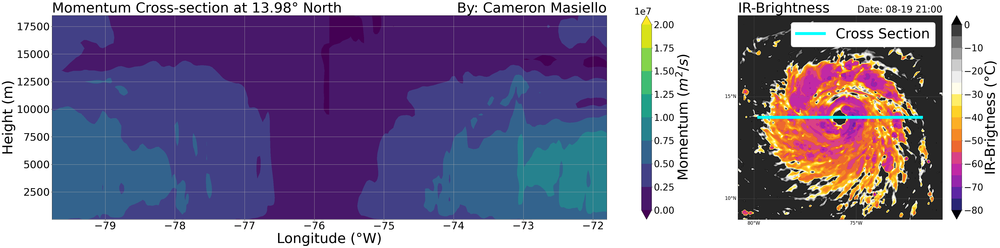

In [9]:
for item in range(15,16):
    ncfile = Dataset(datafiles[item])
    wrf_out_data = xr.open_dataset(datafiles[item])   
    Time = wrf.extract_times(ncfile, timeidx=0, method='cat', squeeze=True, cache=None, meta=False, do_xtime=False)
    timestr=(str(Time))

    #for plotting
    titletime=(timestr[0:10]+' '+timestr[11:16])
    filetime= (timestr[0:10]+'_'+timestr[11:13])

    #Next, isolate the variable we care to look at, in this case we will only care about the pressure pertubations
    P_pertubation = wrf_out_data['P']
    surface_P_pertubation = P_pertubation[0,0,:,:]
    
    # Apply a Gaussian filter to smooth the pressure field
    smoothed_pressure = gaussian_filter(surface_P_pertubation, sigma=10)  # Adjust sigma as necessary

    # Now find the minimum pressure in the smoothed field
    minpressure_smoothed = np.min(smoothed_pressure)
    #print(minpressure_smoothed)
    minp_smoothed = minpressure_smoothed

    # Get the index of the minimum pressure
    p_index_smoothed = np.argwhere(smoothed_pressure == minp_smoothed)
    s_n_smoothed = p_index_smoothed[0][0]
    w_e_smoothed = p_index_smoothed[0][1]

    # Update the storm center position
    ypos = s_n_smoothed
    xpos = w_e_smoothed

    tc_lon = wrf_out_data['XLONG'][0,s_n_smoothed,w_e_smoothed].values
    tc_lat = wrf_out_data['XLAT'][0,s_n_smoothed,w_e_smoothed].values

    #fig, ax = create_map_background(tc_lon,tc_lat) #We are only looking at 11 indices, and our list goes from 0-11, not 24 and up
    #################################################################################################################################################
    #now that we have center information, we can do momentum calculation

    #constants
    lats = getvar(ncfile, "XLAT")
    lons = getvar(ncfile, "XLONG") 
    land = getvar(ncfile, "LANDMASK")
    ptop = getvar(ncfile, "P_TOP")

    nx = lats.shape[0]
    ny = lats.shape[1]
    nz = P_pertubation.shape[1]

    #variables we will need for momentum calculations
    # Get variables 
    z_height = getvar(ncfile, "z")
    p = getvar(ncfile, "pressure")
    ua = getvar(ncfile, "ua")
    va = getvar(ncfile, "va")
    f = wrf_out_data['F'][0,:,:]

    ugrd, vgrd, zgrd, pgrd = [np.zeros([nx,ny,n_zlevs]) for _ in range(4)]  #Range is just the number of variables specified to the left

    for k in range (n_zlevs):
        clev = zlevs[k]
        yzlabs[k] = clev
        ##print('interpolating to: ',clev)

        # Do vertical interpolation to specified pressure surfaces (in hPa)
        uap   = interplevel(ua, z_height, clev)
        vap   = interplevel(va, z_height, clev)
        z_new = interplevel(z_height, z_height, clev)
        p_new = interplevel(p, z_height, clev)

        # Smoothing factor, redundat step from old scripts, but if you would want to apply smoothing you would do that here
        # smfac = 3   # light smoothing, none for reflectivity
        #smoothing example: ugrd[:,:,k] = mpcalc.smooth_gaussian(uap[:,:],smfac)
        ugrd[:,:,k] = uap[:,:]
        vgrd[:,:,k] = vap[:,:]
        zgrd[:,:,k] = z_new[:,:]
        pgrd[:,:,k] = p_new[:,:]
        

    #First, we have to create lists
    ydist, xdist, tcdist, rlonfac, theta_ang = [np.zeros([nx,ny]) for _ in range(5)]
    u_radial, v_azimuth, momentum            = [np.zeros([nx,ny,n_zlevs]) for _ in range(3)]
    
    # compute distance from each grid point to storm center
    rlonfac[:,:] = 111000.*np.cos(d2r*lats[:,:])
    ydist[:,:]   = (lats[:,:] - lats[ypos,xpos])*111000
    xdist[:,:]   = (lons[:,:] - (lons[ypos,xpos]))*rlonfac
    tcdist[:,:]  = (xdist[:,:]**2 + ydist[:,:]**2)**0.5
    
    #cvalculate angle
    theta_ang = np.arctan2(ydist, xdist)

    # Pre-calculate cos and sin of theta_ang for use in vectorized calculations
    cos_theta = np.cos(theta_ang)
    sin_theta = np.sin(theta_ang)
    
    for k in range(n_zlevs):
        #print("The number loop we are in is", k)
        # Vectorized calculation of u_radial and v_azimuth
        u_radial[:,:,k] = ugrd[:,:,k]*cos_theta + vgrd[:,:,k]*sin_theta
        v_azimuth[:,:,k] = -ugrd[:,:,k]*sin_theta + vgrd[:,:,k]*cos_theta
        
        # Vectorized calculation of momentum
        momentum[:,:,k] = tcdist * v_azimuth[:,:,k] + (1/2) * f * (tcdist**2)

    #now, we are doing west/east cross sections so only care about the value of our longitude beginning and end point, 
    lon_beginning = tc_lon - 4 #4 degrees lon to the left of the TC center
    lon_ending    = tc_lon + 4 #4 degrees lon to the right of the TC center

    start_point = CoordPair(lat = tc_lat, lon = lon_beginning )
    end_point = CoordPair(lat = tc_lat, lon = lon_ending)

    #transpose momentum array into the correct shape 
    momentum_transposed = np.transpose(momentum, (2, 0, 1))

    # Convert start and end point lat/lon to grid indices
    start_x, start_y = ll_to_xy(ncfile, start_point.lat, start_point.lon)
    end_x, end_y = ll_to_xy(ncfile, end_point.lat, end_point.lon)

    cross_section_momentum = momentum_transposed[:, start_y.values, start_x.values:end_x.values + 1]

    # Mask the NaN values
    masked_cross_section_momentum = np.ma.masked_invalid(cross_section_momentum)

    vertical_levels = np.arange(masked_cross_section_momentum.shape[0])  # Your vertical levels (51 levels in this case)
    horizontal_extent = np.arange(masked_cross_section_momentum.shape[1])  # Your horizontal extent (581 points in this case)

    # Create an array of longitude values corresponding to the cross-section
    cross_section_lons = lons[start_y.values, start_x.values:end_x.values + 1]
    cross_section_lons = cross_section_lons.squeeze()

    # Assuming pressure is in hPa and we have pressure levels for the Y-axis
    Y = zlevs  # Convert from Pa to hPa 

    # X is 1D, representing the longitude values across the cross-section
    X = cross_section_lons[:]
    
    # Assuming Y is the pressure values obtained as shown in previous steps
    X2D, Y2D = np.meshgrid(cross_section_lons,  Y)
    
    ##################################################################################################
    #IR brightness temperature
    wrf_out_OLR =  wrf_out_data['OLR'][0,:,:]
    
    wrf_out_OLR_T = -273.15 + (wrf_out_OLR.values + 310)/2
    ##################################################################################################
    #Plotting
    fig = plt.figure(figsize=(48, 12))
    
    gs = GridSpec(1, 2, width_ratios=[3, 1], figure=fig)

    #Momentum plot
    ax1 = fig.add_subplot(gs[0])
    contourf1 = ax1.contourf(X2D, Y2D, masked_cross_section_momentum, 
                             levels=np.arange(0, 2.25e7, .25e7), 
                             cmap='viridis', 
                             extend='both')
    #Adding a colorbar for momentum
    cbar1 = fig.colorbar(contourf1, ax=ax1)
    cbar1.set_label(r'Momentum ($m^2/s$)', fontsize=48)
    cbar1.ax.tick_params(labelsize=32)
    #cbar1.ax.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
    cbar1.ax.yaxis.get_offset_text().set(size=32)

    #Set axis labels for momentum plot
    ax1.invert_yaxis()
    ax1.set_xlabel('Longitude (°W)', fontsize=48)
    ax1.set_ylabel('Height (m)', fontsize=48)
    
    #Set tick size for momentum plot
    ax1.tick_params(axis='both', which='major', labelsize=36)
    ax1.tick_params(axis='both', which='minor', labelsize=32)
    
    ax1.grid(True)
    ax1.invert_yaxis()

    #Title for momentum plot
    ax1.set_title(f'Momentum Cross-section at {tc_lat:.2f}° North', loc='left', fontsize=48)
    ax1.set_title("By: Cameron Masiello", loc='right', fontsize=48)

    #IR brightness plot
    ax2 = fig.add_subplot(gs[1], projection=ccrs.PlateCarree())
    create_map_background(tc_lon, tc_lat, ax=ax2)
    contourf2 = ax2.contourf(lons, lats, wrf_out_OLR_T, 
                             origin='lower', 
                             cmap=newcmp, 
                             levels=np.arange(-80, 5, 5), 
                             alpha=.85, 
                             extend='both')

    #Adding a colorbar for IR brightness
    cbar2 = fig.colorbar(contourf2, ax=ax2, fraction=0.046, pad=0.04)
    cbar2.set_label(r'IR-Brigtness (°C)', fontsize=48)
    cbar2.ax.tick_params(labelsize=32)

    #Add cross-section line
    ax2.plot(cross_section_lons, [tc_lat]*len(cross_section_lons), 'cyan', linewidth=10, label='Cross Section')

    #Add legend for IR brightness plot
    ax2.legend(loc='upper right', fontsize=48, framealpha=1)

    #Set axis labels for IR brightness plot
    ax2.set_xlabel('Longitude (°W)', fontsize=48)
    ax2.set_ylabel('Latitude (°N)', fontsize=48)
    
    #Set tick size for momentum plot
    ax2.tick_params(axis='both', which='major', labelsize=36)
    ax2.tick_params(axis='both', which='minor', labelsize=32)

    #Title for IR brightness plot
    ax2.set_title(f'IR-Brightness', loc='left', fontsize = 48)
    ax2.set_title(f'Date: {titletime[5:]}', loc='right', fontsize = 32)

    #Adjust layout and show plot
    plt.tight_layout()
    plt.show()

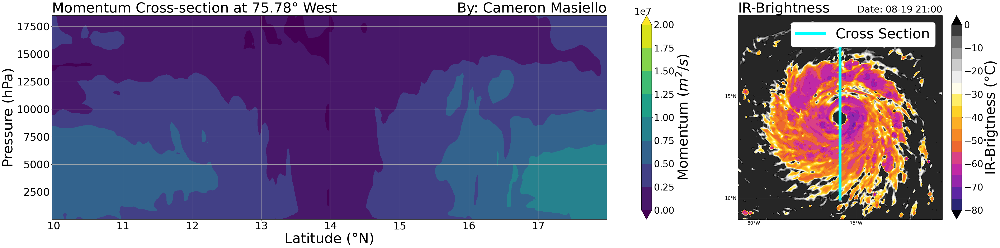

In [10]:
for item in range(15,16):
    ncfile = Dataset(datafiles[item])
    wrf_out_data = xr.open_dataset(datafiles[item])   
    Time = wrf.extract_times(ncfile, timeidx=0, method='cat', squeeze=True, cache=None, meta=False, do_xtime=False)
    timestr=(str(Time))

    #for plotting
    titletime=(timestr[0:10]+' '+timestr[11:16])
    filetime= (timestr[0:10]+'_'+timestr[11:13])

    #Next, isolate the variable we care to look at, in this case we will only care about the pressure pertubations
    P_pertubation = wrf_out_data['P']
    surface_P_pertubation = P_pertubation[0,0,:,:]
    
    # Apply a Gaussian filter to smooth the pressure field
    smoothed_pressure = gaussian_filter(surface_P_pertubation, sigma=10)  # Adjust sigma as necessary

    # Now find the minimum pressure in the smoothed field
    minpressure_smoothed = np.min(smoothed_pressure)
    #print(minpressure_smoothed)
    minp_smoothed = minpressure_smoothed

    # Get the index of the minimum pressure
    p_index_smoothed = np.argwhere(smoothed_pressure == minp_smoothed)
    s_n_smoothed = p_index_smoothed[0][0]
    w_e_smoothed = p_index_smoothed[0][1]

    # Update the storm center position
    ypos = s_n_smoothed
    xpos = w_e_smoothed

    tc_lon = wrf_out_data['XLONG'][0,s_n_smoothed,w_e_smoothed].values
    tc_lat = wrf_out_data['XLAT'][0,s_n_smoothed,w_e_smoothed].values

    #fig, ax = create_map_background(tc_lon,tc_lat) #We are only looking at 11 indices, and our list goes from 0-11, not 24 and up
    #################################################################################################################################################
    #now that we have center information, we can do momentum calculation

    #constants
    lats = getvar(ncfile, "XLAT")
    lons = getvar(ncfile, "XLONG") 
    land = getvar(ncfile, "LANDMASK")
    ptop = getvar(ncfile, "P_TOP")

    nx = lats.shape[0]
    ny = lats.shape[1]
    nz = P_pertubation.shape[1]

    #variables we will need for momentum calculations
    # Get variables 
    z_height = getvar(ncfile, "z")
    p = getvar(ncfile, "pressure")
    ua = getvar(ncfile, "ua")
    va = getvar(ncfile, "va")
    f = wrf_out_data['F'][0,:,:]

    ugrd, vgrd, zgrd, pgrd = [np.zeros([nx,ny,n_zlevs]) for _ in range(4)]  #Range is just the number of variables specified to the left

    for k in range(n_zlevs):
        clev = zlevs[k]
        yzlabs[k] = clev
        ##print('interpolating to: ',clev)

        # Do vertical interpolation to specified pressure surfaces (in hPa)
        uap   = interplevel(ua, z_height, clev)
        vap   = interplevel(va, z_height, clev)
        z_new = interplevel(z_height, z_height, clev)
        p_new = interplevel(p, z_height, clev)

        # Smoothing factor, redundat step from old scripts, but if you would want to apply smoothing you would do that here
        # smfac = 3   # light smoothing, none for reflectivity
        #smoothing example: ugrd[:,:,k] = mpcalc.smooth_gaussian(uap[:,:],smfac)
        ugrd[:,:,k] = uap[:,:]
        vgrd[:,:,k] = vap[:,:]
        zgrd[:,:,k] = z_new[:,:]
        pgrd[:,:,k] = p_new[:,:]
        

    #First, we have to create lists
    ydist, xdist, tcdist, rlonfac, theta_ang = [np.zeros([nx,ny]) for _ in range(5)]
    u_radial, v_azimuth, momentum            = [np.zeros([nx,ny,n_zlevs]) for _ in range(3)]
    
    # compute distance from each grid point to storm center
    rlonfac[:,:] = 111000.*np.cos(d2r*lats[:,:])
    ydist[:,:]   = (lats[:,:] - lats[ypos,xpos])*111000
    xdist[:,:]   = (lons[:,:] - (lons[ypos,xpos]))*rlonfac
    tcdist[:,:]  = (xdist[:,:]**2 + ydist[:,:]**2)**0.5
    
    #cvalculate angle
    theta_ang = np.arctan2(ydist, xdist)

    # Pre-calculate cos and sin of theta_ang for use in vectorized calculations
    cos_theta = np.cos(theta_ang)
    sin_theta = np.sin(theta_ang)
    
    for k in range(n_zlevs):
        #print("The number loop we are in is", k)
        # Vectorized calculation of u_radial and v_azimuth
        u_radial[:,:,k] = ugrd[:,:,k]*cos_theta + vgrd[:,:,k]*sin_theta
        v_azimuth[:,:,k] = -ugrd[:,:,k]*sin_theta + vgrd[:,:,k]*cos_theta
        
        # Vectorized calculation of momentum
        momentum[:,:,k] = tcdist * v_azimuth[:,:,k] + (1/2) * f * (tcdist**2)

    #now, we are doing west/east cross sections so only care about the value of our longitude beginning and end point, 
    lat_beginning = tc_lat - 4 #4 degrees lon to the left of the TC center
    lat_ending    = tc_lat + 4 #4 degrees lon to the right of the TC center

    start_point = CoordPair(lat = lat_beginning, lon = tc_lon)
    end_point = CoordPair(lat = lat_ending, lon = tc_lon)

    #transpose momentum array into the correct shape 
    momentum_transposed = np.transpose(momentum, (2, 0, 1))

    #Convert start and end point lat/lon to grid indices
    start_x, start_y = ll_to_xy(ncfile, start_point.lat, start_point.lon)
    end_x, end_y = ll_to_xy(ncfile, end_point.lat, end_point.lon)

    cross_section_momentum = momentum_transposed[:, start_y.values:end_y.values + 1, start_x.values]

    #Mask the NaN values
    masked_cross_section_momentum = np.ma.masked_invalid(cross_section_momentum)

    vertical_levels = np.arange(masked_cross_section_momentum.shape[0])  # Your vertical levels (51 levels in this case)
    horizontal_extent = np.arange(masked_cross_section_momentum.shape[1])  # Your horizontal extent (581 points in this case)

    #Create an array of longitude values corresponding to the cross-section
    cross_section_lats = lats[start_y.values:end_y.values + 1, start_x.values]
    cross_section_lats = cross_section_lats.squeeze()

    #Height Coordinates
    Y = zlevs

    #X is 1D, representing the longitude values across the cross-section
    X = cross_section_lats[:]
    
    #Assuming Y is the pressure values obtained as shown in previous steps
    X2D, Y2D = np.meshgrid(cross_section_lats,  Y)
    
    ##################################################################################################
    #IR brightness temperature
    wrf_out_OLR =  wrf_out_data['OLR'][0,:,:]
    
    wrf_out_OLR_T = -273.15 + (wrf_out_OLR.values + 310)/2
    ##################################################################################################
    #Plotting
    fig = plt.figure(figsize=(48, 12))
    
    gs = GridSpec(1, 2, width_ratios=[3, 1], figure=fig)

    #Momentum plot
    ax1 = fig.add_subplot(gs[0])
    contourf1 = ax1.contourf(X2D, Y2D, masked_cross_section_momentum, 
                             levels=np.arange(0, 2.25e7, .25e7), 
                             cmap='viridis', 
                             extend='both')
    
    #Adding a colorbar for momentum
    cbar1 = fig.colorbar(contourf1, ax=ax1)
    cbar1.set_label(r'Momentum ($m^2/s$)', fontsize=48)
    cbar1.ax.tick_params(labelsize=32)
    #cbar1.ax.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
    cbar1.ax.yaxis.get_offset_text().set(size=32)

    #Set axis labels for momentum plot
    ax1.invert_yaxis()
    ax1.set_xlabel('Latitude (°N)', fontsize=48)
    ax1.set_ylabel('Pressure (hPa)', fontsize=48)
    
    #Set tick size for momentum plot
    ax1.tick_params(axis='both', which='major', labelsize=36)
    ax1.tick_params(axis='both', which='minor', labelsize=32)
    
    ax1.grid(True)
    ax1.invert_yaxis()

    #Title for momentum plot
    ax1.set_title(f'Momentum Cross-section at {-tc_lon:.2f}° West', loc='left', fontsize=48)
    ax1.set_title("By: Cameron Masiello", loc='right', fontsize=48)

    #IR brightness plot
    ax2 = fig.add_subplot(gs[1], projection=ccrs.PlateCarree())
    create_map_background(tc_lon, tc_lat, ax=ax2)
    
    contourf2 = ax2.contourf(lons, lats, wrf_out_OLR_T, 
                             origin='lower', 
                             cmap=newcmp, 
                             levels=np.arange(-80, 5, 5), 
                             alpha=.85, 
                             extend='both')

    #Adding a colorbar for IR brightness
    cbar2 = fig.colorbar(contourf2, ax=ax2, fraction=0.046, pad=0.04)
    cbar2.set_label(r'IR-Brigtness (°C)', fontsize=48)
    cbar2.ax.tick_params(labelsize=32)

    #Add cross-section line
    ax2.plot([tc_lon]*len(cross_section_lats), cross_section_lats, 'cyan', linewidth=10, label='Cross Section')

    #Add legend for IR brightness plot
    ax2.legend(loc='upper right', fontsize=48, framealpha=1)

    #Set axis labels for IR brightness plot
    ax2.set_xlabel('Longitude (°W)', fontsize=48)
    ax2.set_ylabel('Latitude (°N)', fontsize=48)
    
    #Set tick size for momentum plot
    ax2.tick_params(axis='both', which='major', labelsize=36)
    ax2.tick_params(axis='both', which='minor', labelsize=32)

    #Title for IR brightness plot
    ax2.set_title(f'IR-Brightness', loc='left', fontsize = 48)
    ax2.set_title(f'Date: {titletime[5:]}', loc='right', fontsize = 32)

    #Adjust layout and show plot
    plt.tight_layout()
    plt.show()

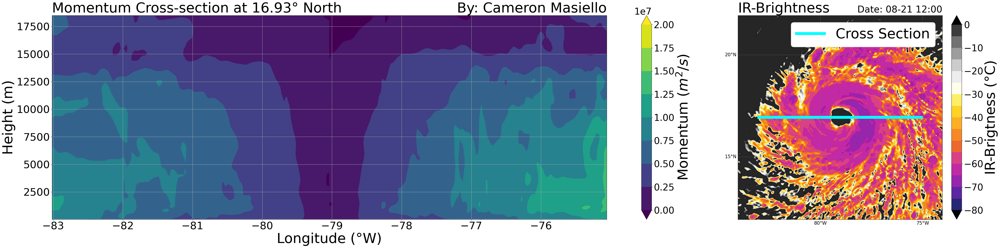

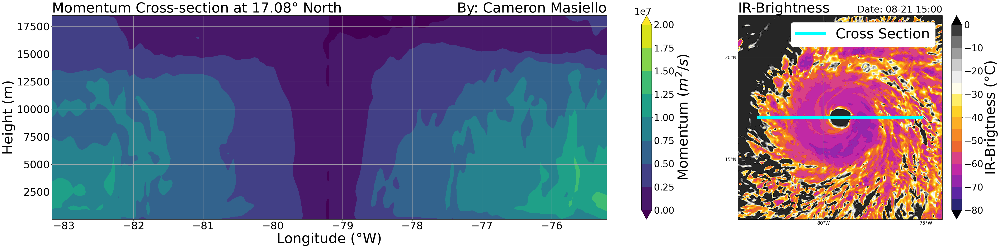

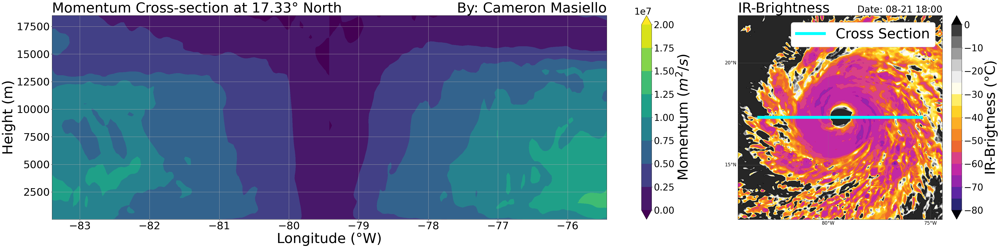

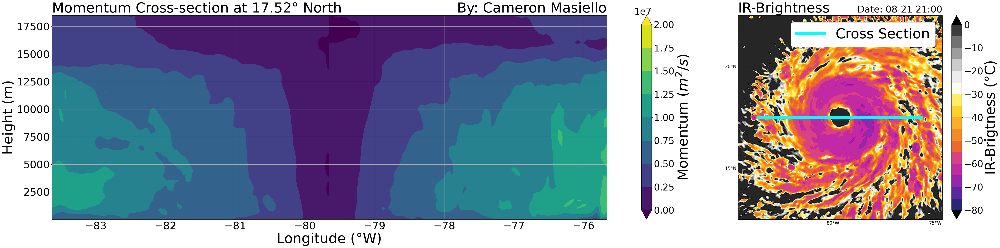

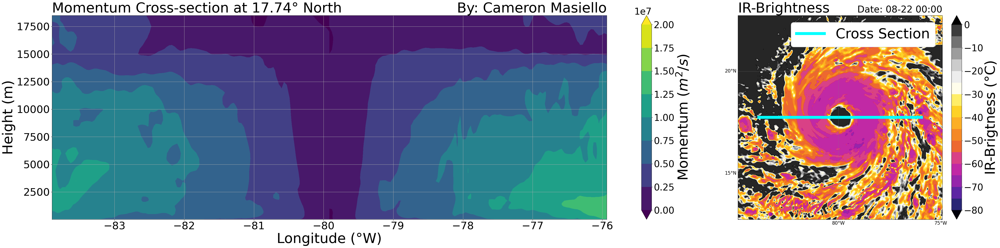

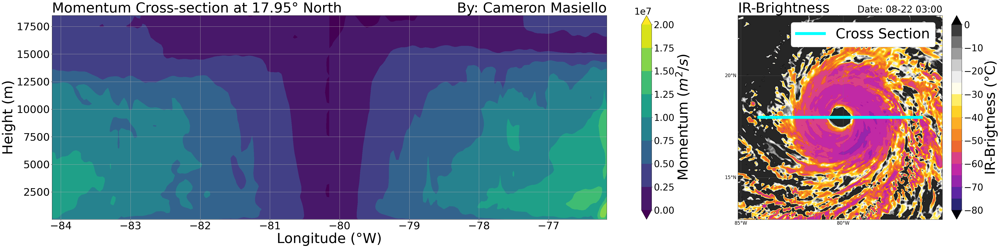

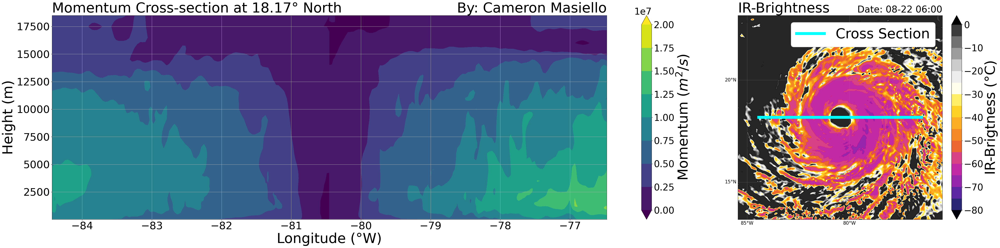

In [12]:
#Below is to save figures to a file to make a gif!

for item in range(28,35):
    ncfile = Dataset(datafiles[item])
    wrf_out_data = xr.open_dataset(datafiles[item])   
    Time = wrf.extract_times(ncfile, timeidx=0, method='cat', squeeze=True, cache=None, meta=False, do_xtime=False)
    timestr=(str(Time))

    #for plotting
    titletime=(timestr[0:10]+' '+timestr[11:16])
    filetime= (timestr[0:10]+'_'+timestr[11:13])

    #Next, isolate the variable we care to look at, in this case we will only care about the pressure pertubations
    P_pertubation = wrf_out_data['P']
    surface_P_pertubation = P_pertubation[0,0,:,:]
    
    # Apply a Gaussian filter to smooth the pressure field
    smoothed_pressure = gaussian_filter(surface_P_pertubation, sigma=10)  # Adjust sigma as necessary

    # Now find the minimum pressure in the smoothed field
    minpressure_smoothed = np.min(smoothed_pressure)
    #print(minpressure_smoothed)
    minp_smoothed = minpressure_smoothed

    # Get the index of the minimum pressure
    p_index_smoothed = np.argwhere(smoothed_pressure == minp_smoothed)
    s_n_smoothed = p_index_smoothed[0][0]
    w_e_smoothed = p_index_smoothed[0][1]

    # Update the storm center position
    ypos = s_n_smoothed
    xpos = w_e_smoothed

    tc_lon = wrf_out_data['XLONG'][0,s_n_smoothed,w_e_smoothed].values
    tc_lat = wrf_out_data['XLAT'][0,s_n_smoothed,w_e_smoothed].values

    #fig, ax = create_map_background(tc_lon,tc_lat) #We are only looking at 11 indices, and our list goes from 0-11, not 24 and up
    #################################################################################################################################################
    #now that we have center information, we can do momentum calculation

    #constants
    lats = getvar(ncfile, "XLAT")
    lons = getvar(ncfile, "XLONG") 
    land = getvar(ncfile, "LANDMASK")
    ptop = getvar(ncfile, "P_TOP")

    nx = lats.shape[0]
    ny = lats.shape[1]
    nz = P_pertubation.shape[1]

    #variables we will need for momentum calculations
    # Get variables 
    z_height = getvar(ncfile, "z")
    p = getvar(ncfile, "pressure")
    ua = getvar(ncfile, "ua")
    va = getvar(ncfile, "va")
    f = wrf_out_data['F'][0,:,:]

    ugrd, vgrd, zgrd, pgrd = [np.zeros([nx,ny,n_zlevs]) for _ in range(4)]  #Range is just the number of variables specified to the left

    for k in range (n_zlevs):
        clev = zlevs[k]
        yzlabs[k] = clev
        ##print('interpolating to: ',clev)

        # Do vertical interpolation to specified pressure surfaces (in hPa)
        uap   = interplevel(ua, z_height, clev)
        vap   = interplevel(va, z_height, clev)
        z_new = interplevel(z_height, z_height, clev)
        p_new = interplevel(p, z_height, clev)

        # Smoothing factor, redundat step from old scripts, but if you would want to apply smoothing you would do that here
        # smfac = 3   # light smoothing, none for reflectivity
        #smoothing example: ugrd[:,:,k] = mpcalc.smooth_gaussian(uap[:,:],smfac)
        ugrd[:,:,k] = uap[:,:]
        vgrd[:,:,k] = vap[:,:]
        zgrd[:,:,k] = z_new[:,:]
        pgrd[:,:,k] = p_new[:,:]
        

    #First, we have to create lists
    ydist, xdist, tcdist, rlonfac, theta_ang = [np.zeros([nx,ny]) for _ in range(5)]
    u_radial, v_azimuth, momentum            = [np.zeros([nx,ny,n_zlevs]) for _ in range(3)]
    
    # compute distance from each grid point to storm center
    rlonfac[:,:] = 111000.*np.cos(d2r*lats[:,:])
    ydist[:,:]   = (lats[:,:] - lats[ypos,xpos])*111000
    xdist[:,:]   = (lons[:,:] - (lons[ypos,xpos]))*rlonfac
    tcdist[:,:]  = (xdist[:,:]**2 + ydist[:,:]**2)**0.5
    
    #cvalculate angle
    theta_ang = np.arctan2(ydist, xdist)

    # Pre-calculate cos and sin of theta_ang for use in vectorized calculations
    cos_theta = np.cos(theta_ang)
    sin_theta = np.sin(theta_ang)
    
    for k in range(n_zlevs):
        #print("The number loop we are in is", k)
        # Vectorized calculation of u_radial and v_azimuth
        u_radial[:,:,k] = ugrd[:,:,k]*cos_theta + vgrd[:,:,k]*sin_theta
        v_azimuth[:,:,k] = -ugrd[:,:,k]*sin_theta + vgrd[:,:,k]*cos_theta
        
        # Vectorized calculation of momentum
        momentum[:,:,k] = tcdist * v_azimuth[:,:,k] + (1/2) * f * (tcdist**2)

    #now, we are doing west/east cross sections so only care about the value of our longitude beginning and end point, 
    lon_beginning = tc_lon - 4 #4 degrees lon to the left of the TC center
    lon_ending    = tc_lon + 4 #4 degrees lon to the right of the TC center

    start_point = CoordPair(lat = tc_lat, lon = lon_beginning )
    end_point = CoordPair(lat = tc_lat, lon = lon_ending)

    #transpose momentum array into the correct shape 
    momentum_transposed = np.transpose(momentum, (2, 0, 1))

    # Convert start and end point lat/lon to grid indices
    start_x, start_y = ll_to_xy(ncfile, start_point.lat, start_point.lon)
    end_x, end_y = ll_to_xy(ncfile, end_point.lat, end_point.lon)

    cross_section_momentum = momentum_transposed[:, start_y.values, start_x.values:end_x.values + 1]

    # Mask the NaN values
    masked_cross_section_momentum = np.ma.masked_invalid(cross_section_momentum)

    vertical_levels = np.arange(masked_cross_section_momentum.shape[0])  # Your vertical levels (51 levels in this case)
    horizontal_extent = np.arange(masked_cross_section_momentum.shape[1])  # Your horizontal extent (581 points in this case)

    # Create an array of longitude values corresponding to the cross-section
    cross_section_lons = lons[start_y.values, start_x.values:end_x.values + 1]
    cross_section_lons = cross_section_lons.squeeze()

    # Assuming pressure is in hPa and we have pressure levels for the Y-axis
    Y = zlevs  # Convert from Pa to hPa 

    # X is 1D, representing the longitude values across the cross-section
    X = cross_section_lons[:]
    
    # Assuming Y is the pressure values obtained as shown in previous steps
    X2D, Y2D = np.meshgrid(cross_section_lons,  Y)
    
    ##################################################################################################
    #IR brightness temperature
    wrf_out_OLR =  wrf_out_data['OLR'][0,:,:]
    
    wrf_out_OLR_T = -273.15 + (wrf_out_OLR.values + 310)/2
    ##################################################################################################
    #Plotting
    fig = plt.figure(figsize=(48, 12))
    
    gs = GridSpec(1, 2, width_ratios=[3, 1], figure=fig)

    #Momentum plot
    ax1 = fig.add_subplot(gs[0])
    contourf1 = ax1.contourf(X2D, Y2D, masked_cross_section_momentum, 
                             levels=np.arange(0, 2.25e7, .25e7), 
                             cmap='viridis', 
                             extend='both')
    #Adding a colorbar for momentum
    cbar1 = fig.colorbar(contourf1, ax=ax1)
    cbar1.set_label(r'Momentum ($m^2/s$)', fontsize=48)
    cbar1.ax.tick_params(labelsize=32)
    #cbar1.ax.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
    cbar1.ax.yaxis.get_offset_text().set(size=32)

    #Set axis labels for momentum plot
    ax1.invert_yaxis()
    ax1.set_xlabel('Longitude (°W)', fontsize=48)
    ax1.set_ylabel('Height (m)', fontsize=48)
    
    #Set tick size for momentum plot
    ax1.tick_params(axis='both', which='major', labelsize=36)
    ax1.tick_params(axis='both', which='minor', labelsize=32)
    
    ax1.grid(True)
    ax1.invert_yaxis()

    #Title for momentum plot
    ax1.set_title(f'Momentum Cross-section at {tc_lat:.2f}° North', loc='left', fontsize=48)
    ax1.set_title("By: Cameron Masiello", loc='right', fontsize=48)

    #IR brightness plot
    ax2 = fig.add_subplot(gs[1], projection=ccrs.PlateCarree())
    create_map_background(tc_lon, tc_lat, ax=ax2)
    contourf2 = ax2.contourf(lons, lats, wrf_out_OLR_T, 
                             origin='lower', 
                             cmap=newcmp, 
                             levels=np.arange(-80, 5, 5), 
                             alpha=.85, 
                             extend='both')

    #Adding a colorbar for IR brightness
    cbar2 = fig.colorbar(contourf2, ax=ax2, fraction=0.046, pad=0.04)
    cbar2.set_label(r'IR-Brigtness (°C)', fontsize=48)
    cbar2.ax.tick_params(labelsize=32)

    #Add cross-section line
    ax2.plot(cross_section_lons, [tc_lat]*len(cross_section_lons), 'cyan', linewidth=10, label='Cross Section')

    #Add legend for IR brightness plot
    ax2.legend(loc='upper right', fontsize=48, framealpha=1)

    #Set axis labels for IR brightness plot
    ax2.set_xlabel('Longitude (°W)', fontsize=48)
    ax2.set_ylabel('Latitude (°N)', fontsize=48)
    
    #Set tick size for momentum plot
    ax2.tick_params(axis='both', which='major', labelsize=36)
    ax2.tick_params(axis='both', which='minor', labelsize=32)

    #Title for IR brightness plot
    ax2.set_title(f'IR-Brightness', loc='left', fontsize = 48)
    ax2.set_title(f'Date: {titletime[5:]}', loc='right', fontsize = 32)

    #Adjust layout and show plot
    plt.tight_layout()
    
    #Save Figure now:
    output_dir =   '/Users/cjmasiel/Desktop/Cross_Section'
    output_path = f'/Users/cjmasiel/Desktop/Cross_Section/momentum_plot_{filetime}.png'
    
    plt.savefig(output_path, bbox_inches='tight')
    
    #cool, now show the plot!
    plt.show()

In [13]:
#Now, Create a GIF!
import imageio
import glob

images = []
all_imgs = sorted(glob.glob("/Users/cjmasiel/Desktop/Cross_Section/*.png"))

for i in range(len(all_imgs)):
     images.append(imageio.imread(all_imgs[i]))

imageio.mimsave('/Users/cjmasiel/Desktop/Cross_Section/Cross_Section.gif', images, duration=1,loop=0)

/var/folders/vh/tg2m9q6x4z92ns7xk0s1gfdm0000gt/T/ipykernel_16372/4187402923.py:9: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning dissapear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images.append(imageio.imread(all_imgs[i]))
